In [5]:
pip install seaborn

Note: you may need to restart the kernel to use updated packages.


In [12]:
pip install plotly

   ---------------------------------------- 0.0/9.9 MB ? eta -:--:--
   ---------- ----------------------------- 2.6/9.9 MB 16.7 MB/s eta 0:00:01
   ----------------------- ---------------- 5.8/9.9 MB 16.0 MB/s eta 0:00:01
   ------------------------------------ --- 8.9/9.9 MB 15.4 MB/s eta 0:00:01
   ---------------------------------------- 9.9/9.9 MB 14.7 MB/s  0:00:00

   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   ---------------------------------------- 0/2 [narwhals]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- ------------------- 1/2 [plotly]
   -------------------- -------------------

In [7]:
import pandas as pd
import numpy as np
from pathlib import Path
import matplotlib.pyplot as plt
import seaborn as sns

In [8]:
PROCESSED_DATA_DIR = Path("data/processing_checkpoint")
checkpoint_file_path = PROCESSED_DATA_DIR / "03_10_day_window_sliced.parquet"
df_final = pd.read_parquet(checkpoint_file_path)
df_final.sample(5)

,userId,gender,registration,operating_system,browser,num_unique_artists,count_about,count_add_friend,count_add_to_playlist,count_cancel,...,late_songs_played,song_listening_change,recent_actions_last_3d,recent_activity_ratio,early_avg_items_per_session,late_avg_items_per_session,session_depth_change,churn_day,label,snapshot_day
57060,1509323,F,2018-09-23 08:35:55,Macintosh,Firefox,6,0,0,0,0,...,1.0,-3.0,3.0,0.272727,3.000000,4.000000,1.000000,42.0,0,9
39121,1296945,F,2018-07-09 22:33:38,Windows,Chrome,362,2,7,9,0,...,359.0,304.0,0.0,0.000000,35.000000,89.115556,54.115556,NaN,0,19
33353,1948337,F,2018-08-29 05:11:34,Windows,Edge,72,0,4,1,0,...,57.0,43.0,0.0,0.000000,8.500000,42.975000,34.475000,NaN,0,19
3673,1234787,F,2018-09-14 06:36:56,Windows,Chrome,470,0,8,12,0,...,371.0,197.0,0.0,0.000000,22.430556,49.693920,27.263365,NaN,0,39
9780,1340123,F,2018-09-22 21:01:47,Macintosh,Firefox,967,4,39,34,0,...,785.0,251.0,114.0,0.070197,93.049767,84.109184,-8.940583,NaN,0,39


In [ ]:
df_final.columns


Index(['userId', 'gender', 'registration', 'operating_system', 'browser',
       'num_unique_artists', 'count_about', 'count_add_friend',
       'count_add_to_playlist', 'count_cancel',
       'count_cancellation_confirmation', 'count_downgrade', 'count_error',
       'count_help', 'count_home', 'count_logout', 'count_nextsong',
       'count_roll_advert', 'count_save_settings', 'count_settings',
       'count_submit_downgrade', 'count_submit_upgrade', 'count_thumbs_down',
       'count_thumbs_up', 'count_upgrade', 'count_total_sessions', 'last_time',
       'user_lifecycle_h', 'ttl_length', 'item_per_session', 'frequency',
       'avg_songs_session', 'thumbs_ratio', 'errors_per_session',
       'ads_per_session', 'last_level', 'hours_since_last_session',
       'active_days', 'active_days_ratio', 'session_length_variance',
       'is_new_user', 'hours_since_downgrade', 'num_unique_songs',
       'unique_songs_ratio', 'early_actions', 'late_actions',
       'within_window_activity_rati

In [153]:
df_final = df_final.drop(columns=["count_cancel", "count_cancellation_confirmation"])

In [10]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 60434 entries, 0 to 60433
Data columns (total 59 columns):
 #   Column                           Non-Null Count  Dtype         
---  ------                           --------------  -----         
 0   userId                           60434 non-null  int64         
 1   gender                           60434 non-null  category      
 2   registration                     60434 non-null  datetime64[us]
 3   operating_system                 60434 non-null  category      
 4   browser                          60434 non-null  category      
 5   num_unique_artists               60434 non-null  int64         
 6   count_about                      60434 non-null  int64         
 7   count_add_friend                 60434 non-null  int64         
 8   count_add_to_playlist            60434 non-null  int64         
 9   count_cancel                     60434 non-null  int64         
 10  count_cancellation_confirmation  60434 non-null  int64    

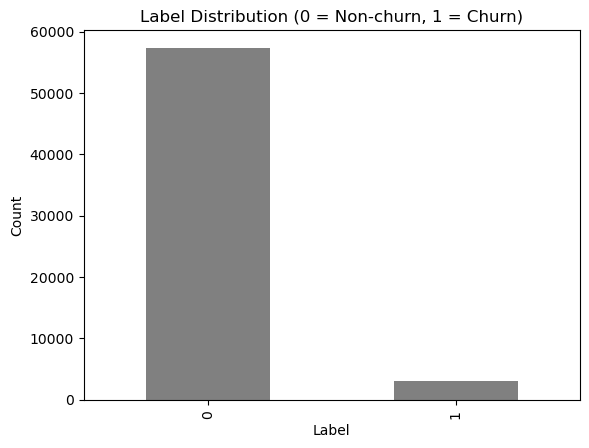

In [53]:
df_final['label'].value_counts().plot(kind='bar', color="gray")
plt.title("Label Distribution (0 = Non-churn, 1 = Churn)")
plt.xlabel("Label")
plt.ylabel("Count")
plt.show()


In [124]:
import plotly.express as px

label_stats = df_final["label"].value_counts().reset_index()
label_stats.columns = ["label", "count"]

# Convert label to string for nicer category display
label_stats["label"] = label_stats["label"].astype(str)

fig = px.bar(
    label_stats,
    x="label",
    y="count",
    text="count",
    title="Label Distribution (0 = Non-churn, 1 = Churn)"
)


fig.update_layout(
    title_x=0.5,
    height=500, width=500
)

fig.show()


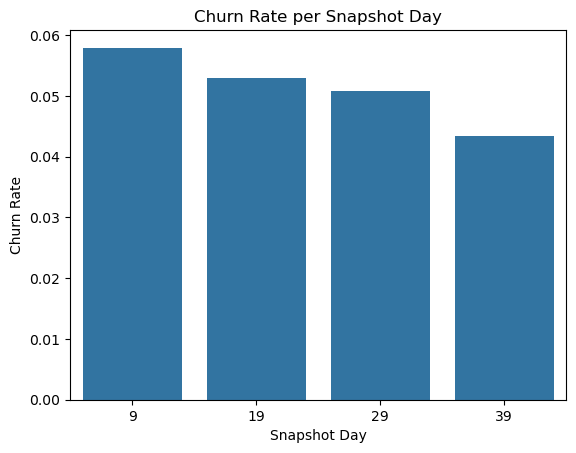

In [47]:
snapshot_stats = df_final.groupby("snapshot_day")["label"].mean()

sns.barplot(x=snapshot_stats.index, y=snapshot_stats.values)
plt.title("Churn Rate per Snapshot Day")
plt.ylabel("Churn Rate")
plt.xlabel("Snapshot Day")
plt.show()


In [98]:
import plotly.express as px

snapshot_stats = df_final.groupby("snapshot_day")["label"].mean().reset_index()
snapshot_stats["snapshot_day"] = snapshot_stats["snapshot_day"].astype(str)

fig = px.bar(
    snapshot_stats,
    x="snapshot_day",
    y="label",
    labels={"snapshot_day": "Snapshot Day", "label": "Churn Rate"},
    title="Churn Rate per Snapshot Day",
    text="label",
)

# Format text on bars
fig.update_traces(texttemplate='%{text:.3f}', textposition='inside')

# Layout tweaks
fig.update_layout(
    title_x=0.5,
    height=500, width=500
)


fig.show()


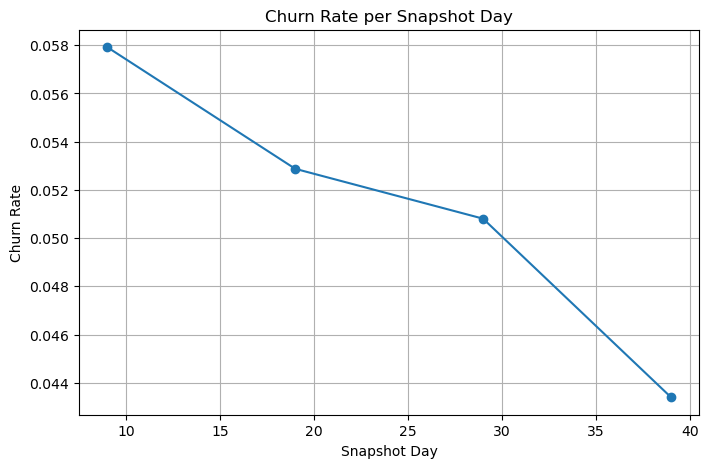

In [22]:
snapshot_rate = df_final.groupby("snapshot_day")["label"].mean()

plt.figure(figsize=(8,5))
plt.plot(snapshot_rate.index, snapshot_rate.values, marker='o')
plt.title("Churn Rate per Snapshot Day")
plt.xlabel("Snapshot Day")
plt.ylabel("Churn Rate")
plt.grid(True)
plt.show()


In [102]:
fig = px.line(snapshot_rate.reset_index(), 
              x="snapshot_day", y="label",
              title="Churn Rate per Snapshot Day", markers=True)
fig.update_layout(title_x=0.5, height=500, width=500)
fig.show()


In [24]:
important_features = [
    "hours_since_last_session",
    "ads_per_session",
    "thumbs_ratio",
    "user_lifecycle_h",
    "avg_songs_session",
    "active_days_ratio",
    "frequency",
    "item_per_session",
    "session_length_variance"
]


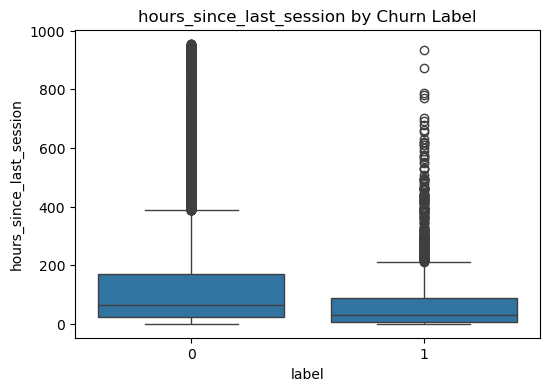

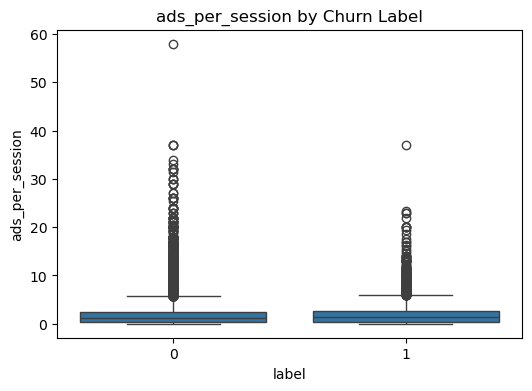

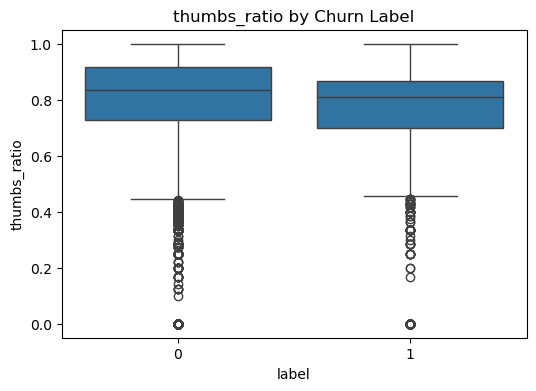

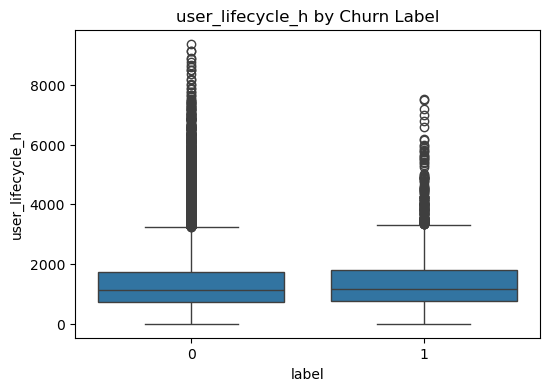

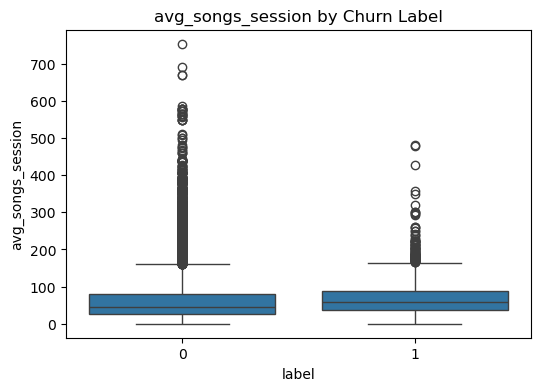

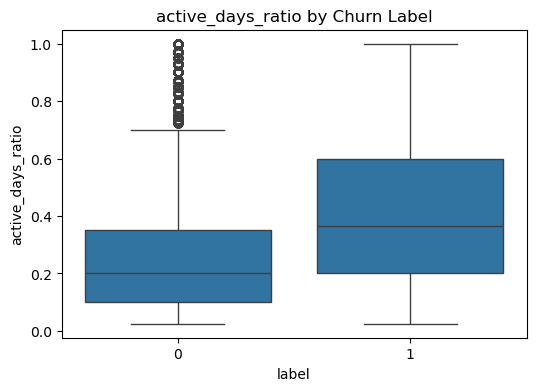

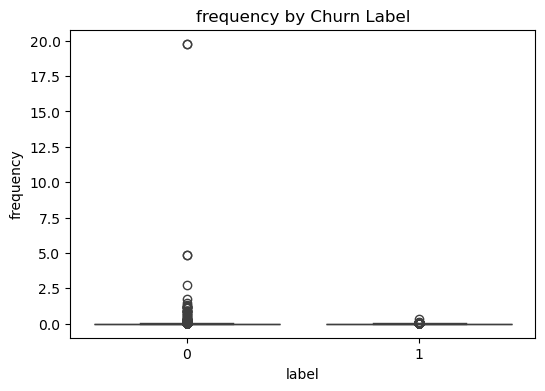

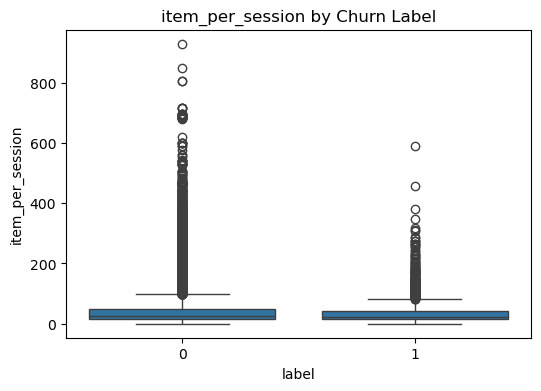

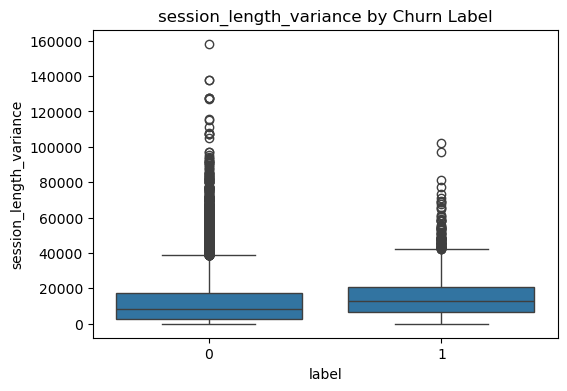

In [25]:
import seaborn as sns

for feat in important_features:
    plt.figure(figsize=(6,4))
    sns.boxplot(data=df_final, x="label", y=feat)
    plt.title(f"{feat} by Churn Label")
    plt.show()


In [ ]:
import plotly.express as px
import numpy as np
import pandas as pd

def auto_boxplot(feature_list, df, height=500, width=500):

    for feat in feature_list:

        # Compute IQR thresholds to zoom in boxplot
        q1 = df[feat].quantile(0.25)
        q3 = df[feat].quantile(0.75)
        iqr = q3 - q1
        upper = q3 + 1.5 * iqr
        lower = max(q1 - 1.5 * iqr, 0)

        # Compute medians
        med0 = df[df["label"]==0][feat].median()
        med1 = df[df["label"]==1][feat].median()

        fig = px.box(
            df, x="label", y=feat,
            points="suspectedoutliers",
            title=f"{feat} vs Churn (zoom-in with IQR rule)",
            template="plotly_white",
        )

        fig.update_layout(title_x=0.5, height=height, width=width)

        # Apply zoom in using IQR
        fig.update_yaxes(range=[lower, upper])

        # Add median lines + annotation
        fig.add_hline(y=med0, line_dash="dot", line_color="gray",
                      annotation_text=f"Median 0 = {med0:.3f}", annotation_position="top left")
        fig.add_hline(y=med1, line_dash="dot", line_color="red",
                      annotation_text=f"Median 1 = {med1:.3f}", annotation_position="top right")

        fig.show()

auto_boxplot(important_features, df_final)



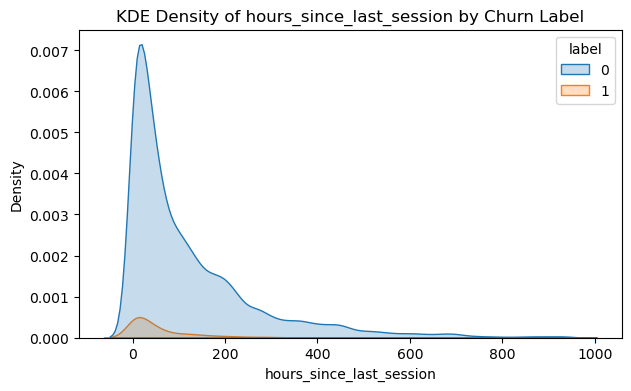

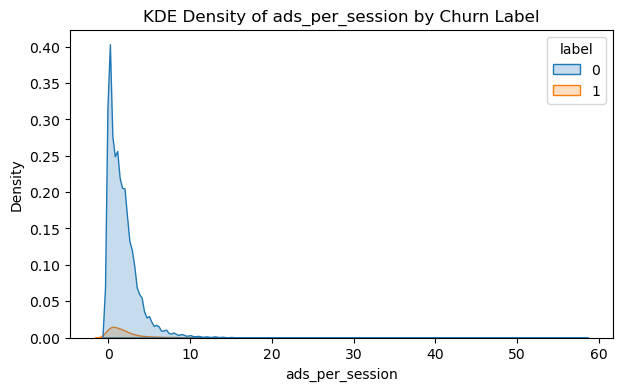

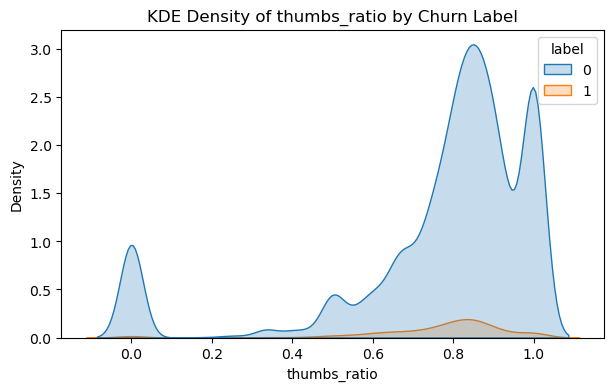

In [27]:
kde_features = [
    "hours_since_last_session",
    "ads_per_session",
    "thumbs_ratio"
]
for feat in kde_features:
    plt.figure(figsize=(7,4))
    sns.kdeplot(data=df_final, x=feat, hue="label", fill=True)
    plt.title(f"KDE Density of {feat} by Churn Label")
    plt.show()


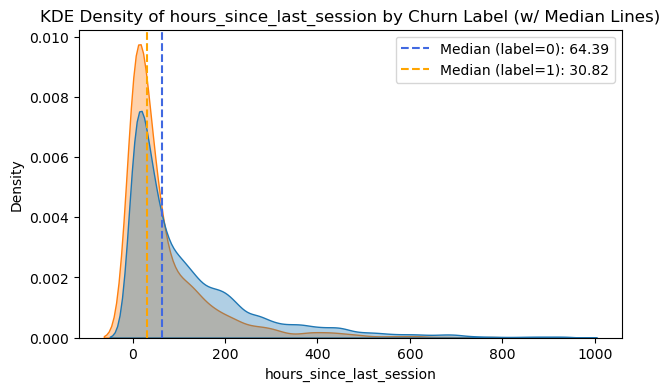

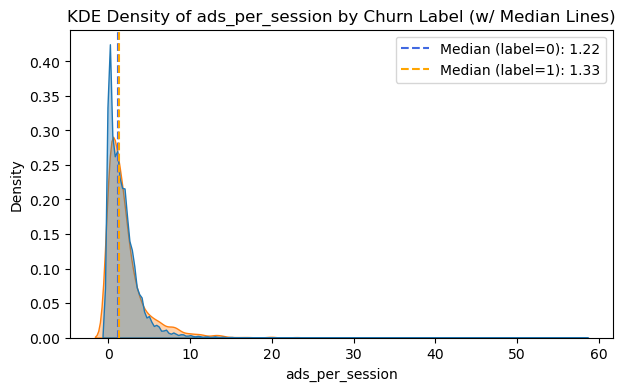

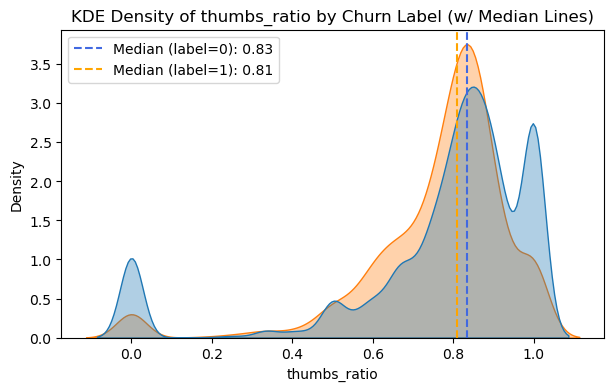

In [168]:
kde_features = [
    "hours_since_last_session",
    "ads_per_session",
    "thumbs_ratio"
]

for feat in kde_features:
    plt.figure(figsize=(7,4))

    # KDE plot
    sns.kdeplot(
        data=df_final,
        x=feat,
        hue="label",
        fill=True,
        common_norm=False,
        alpha=0.35
    )

    # Compute medians
    median_0 = df_final[df_final["label"] == 0][feat].median()
    median_1 = df_final[df_final["label"] == 1][feat].median()

    # Add dashed median lines
    plt.axvline(median_0, color="royalblue", linestyle="--",
                label=f"Median (label=0): {median_0:.2f}")
    plt.axvline(median_1, color="orange", linestyle="--",
                label=f"Median (label=1): {median_1:.2f}")

    plt.title(f"KDE Density of {feat} by Churn Label (w/ Median Lines)")
    plt.legend()
    plt.show()


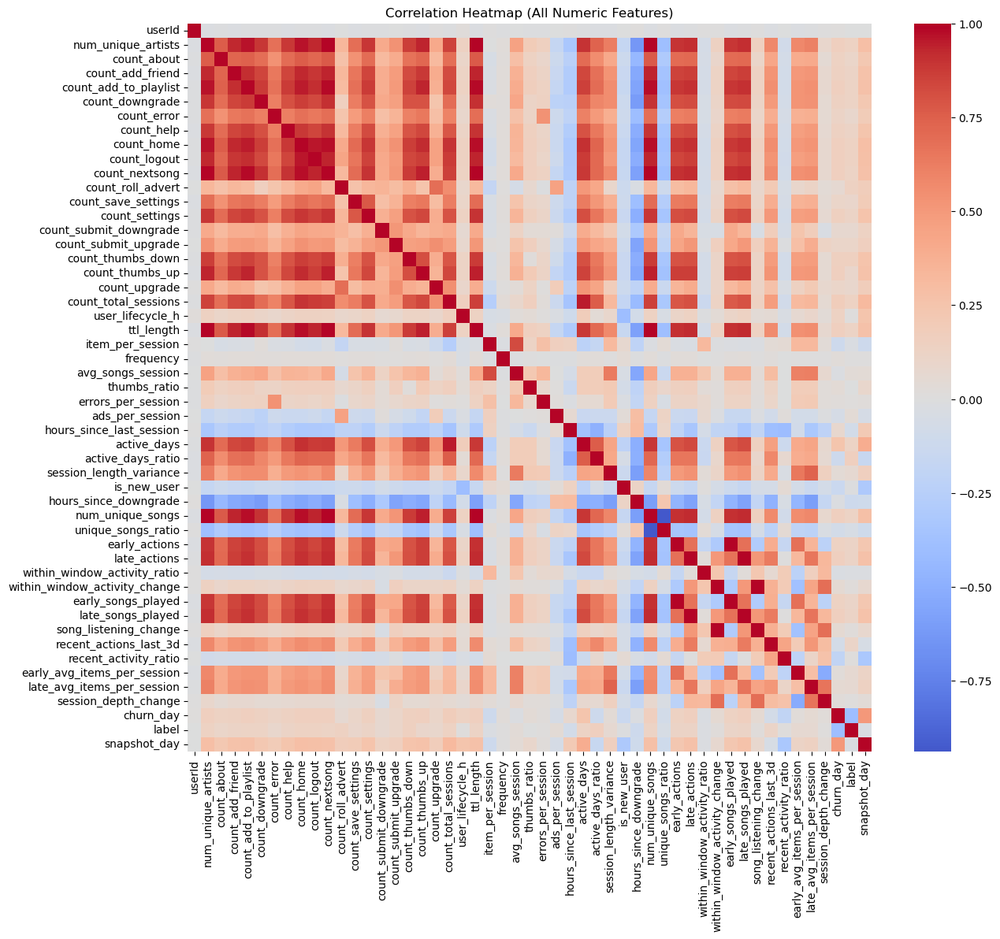

In [156]:
import numpy as np
import seaborn as sns

numeric_cols = df_final.select_dtypes(include=[np.number]).columns

plt.figure(figsize=(14,12))
corr = df_final[numeric_cols].corr()
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap (All Numeric Features)")
plt.show()


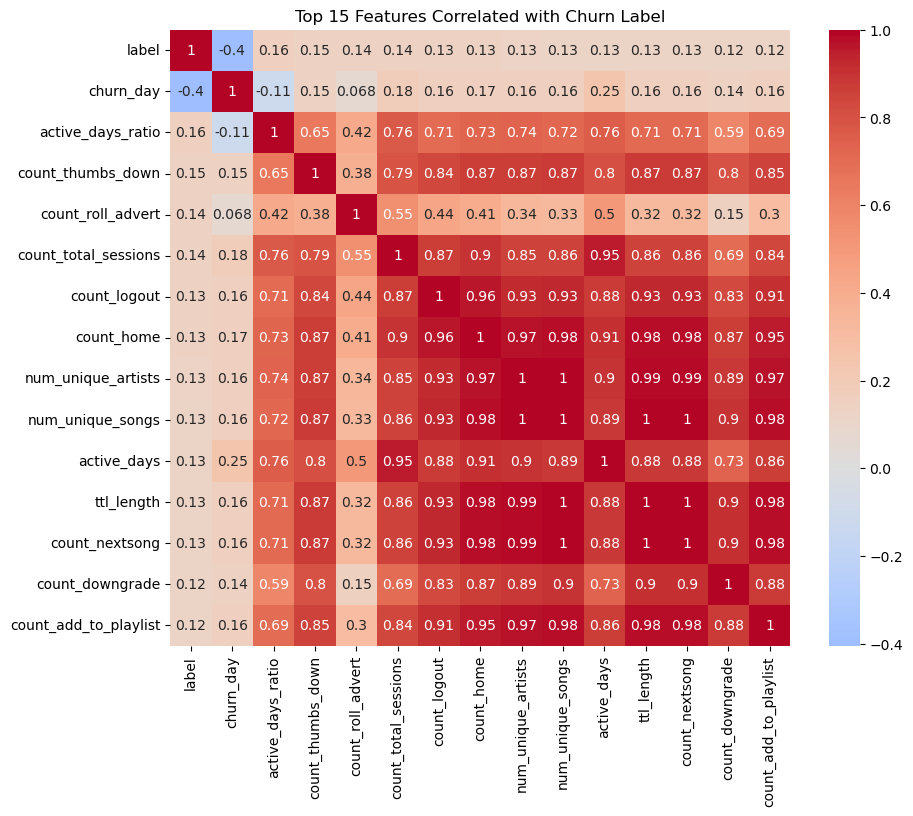

In [157]:
corr_label = corr["label"].abs().sort_values(ascending=False)
top15 = corr_label.index[:15]

plt.figure(figsize=(10,8))
sns.heatmap(df_final[top15].corr(), annot=True, cmap="coolwarm", center=0)
plt.title("Top 15 Features Correlated with Churn Label")
plt.show()


In [158]:
trend_features = [
    "hours_since_last_session",
    "avg_songs_session",
    "thumbs_ratio"
]


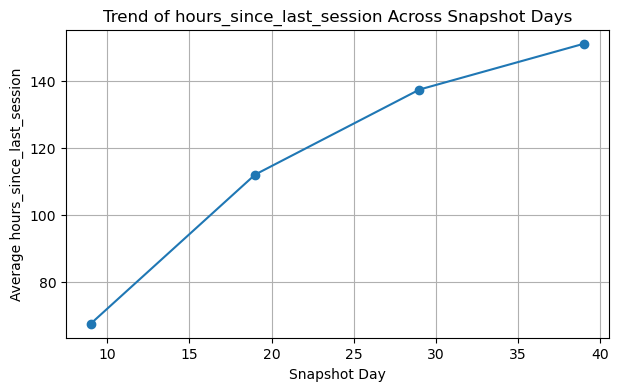

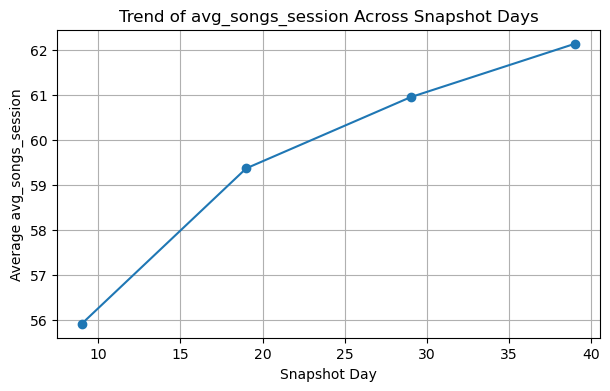

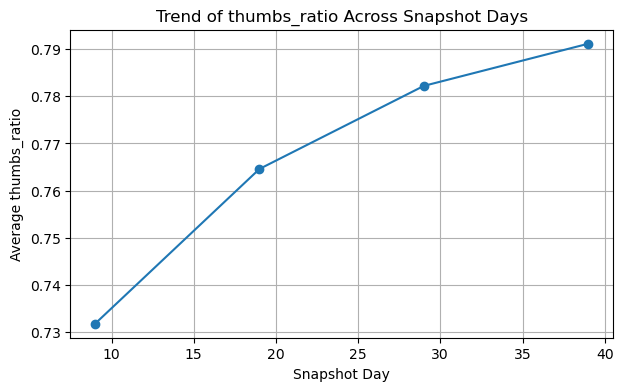

In [159]:
for feat in trend_features:
    trend = df_final.groupby("snapshot_day")[feat].mean()

    plt.figure(figsize=(7,4))
    plt.plot(trend.index, trend.values, marker='o')
    plt.title(f"Trend of {feat} Across Snapshot Days")
    plt.xlabel("Snapshot Day")
    plt.ylabel(f"Average {feat}")
    plt.grid(True)
    plt.show()


In [160]:
import plotly.express as px

trend_features = [
    "hours_since_last_session",
    "avg_songs_session",
    "thumbs_ratio"
]

for feat in trend_features:

    trend = df_final.groupby("snapshot_day")[feat].mean().reset_index()
    trend["snapshot_day"] = trend["snapshot_day"].astype(str)

    fig = px.line(
        trend,
        x="snapshot_day",
        y=feat,
        markers=True,
        title=f"Trend of {feat} Across Snapshot Days",
    )

    fig.update_layout(
        title_x=0.5,
        width=500,
        height=500,
        xaxis_title="Snapshot Day",
        yaxis_title=f"Average {feat}",
    )

    fig.show()


In [162]:
num_cols = [
    'num_unique_artists', 'count_about', 'count_add_friend', 'count_add_to_playlist', 
    'count_downgrade', 'count_error', 
    'count_help', 'count_home', 'count_logout', 'count_nextsong', 'count_roll_advert', 
    'count_save_settings', 'count_settings', 'count_submit_downgrade', 
    'count_submit_upgrade', 'count_thumbs_down', 'count_thumbs_up', 'count_upgrade', 
    'count_total_sessions', 'user_lifecycle_h', 'ttl_length', 'item_per_session', 
    'frequency', 'avg_songs_session', 'thumbs_ratio', 'errors_per_session', 
    'ads_per_session', 'hours_since_last_session', 'active_days', 'active_days_ratio', 
    'session_length_variance', 'hours_since_downgrade', 
    'num_unique_songs', 'unique_songs_ratio', 'early_actions', 'late_actions', 
    'within_window_activity_ratio', 'within_window_activity_change', 
    'early_songs_played', 'late_songs_played', 'song_listening_change', 
    'recent_actions_last_3d', 'recent_activity_ratio', 'early_avg_items_per_session', 
    'late_avg_items_per_session', 'session_depth_change', 'churn_day'
]


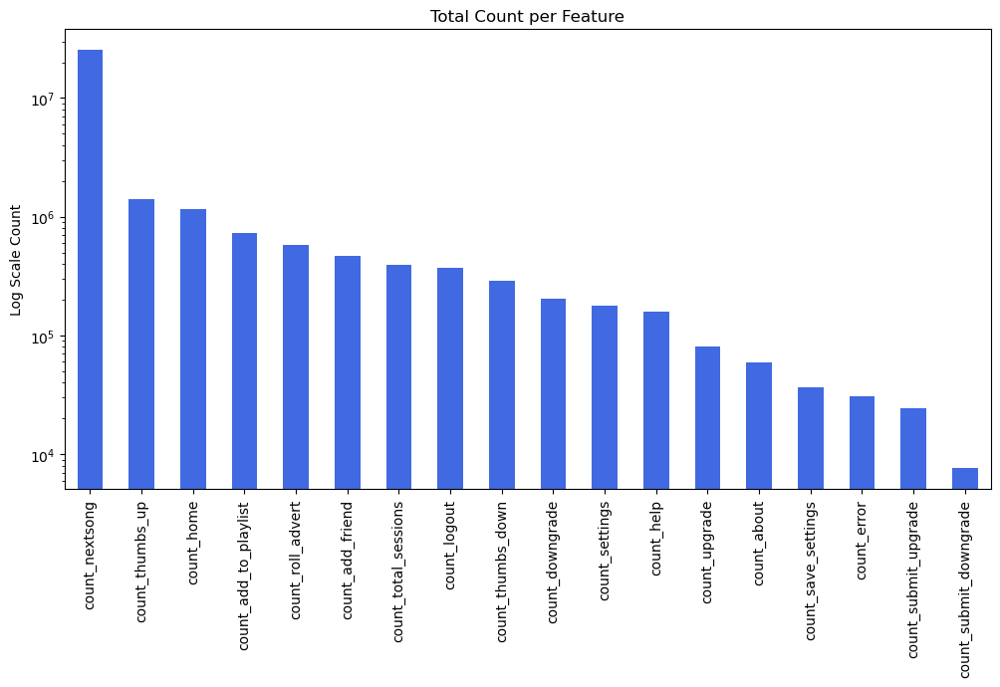

In [166]:
count_cols = [c for c in num_cols if "count" in c]

plt.figure(figsize=(12,6))
df_final[count_cols].sum().sort_values(ascending=False).plot(kind="bar", color="royalblue")
plt.title("Total Count per Feature")
plt.xticks(rotation=90)
plt.yscale("log")
plt.ylabel("Log Scale Count")
plt.show()


In [118]:
count_cols = [c for c in df_final.columns if "count" in c]

sum_data = df_final[count_cols].sum()

plot_df = pd.DataFrame({
    'Feature': sum_data.index,
    'Total_Count': sum_data.values
})

plot_df = plot_df.sort_values(by='Total_Count', ascending=False)

fig = px.bar(
    plot_df,
    x='Feature',
    y='Total_Count',
    log_y=True,
    title="Total Count per Feature (Log Scale)",
)

fig.update_layout(
    title_x=0.5,
    width=800,
    height=800,
    xaxis_tickangle=90,
)

fig.show()

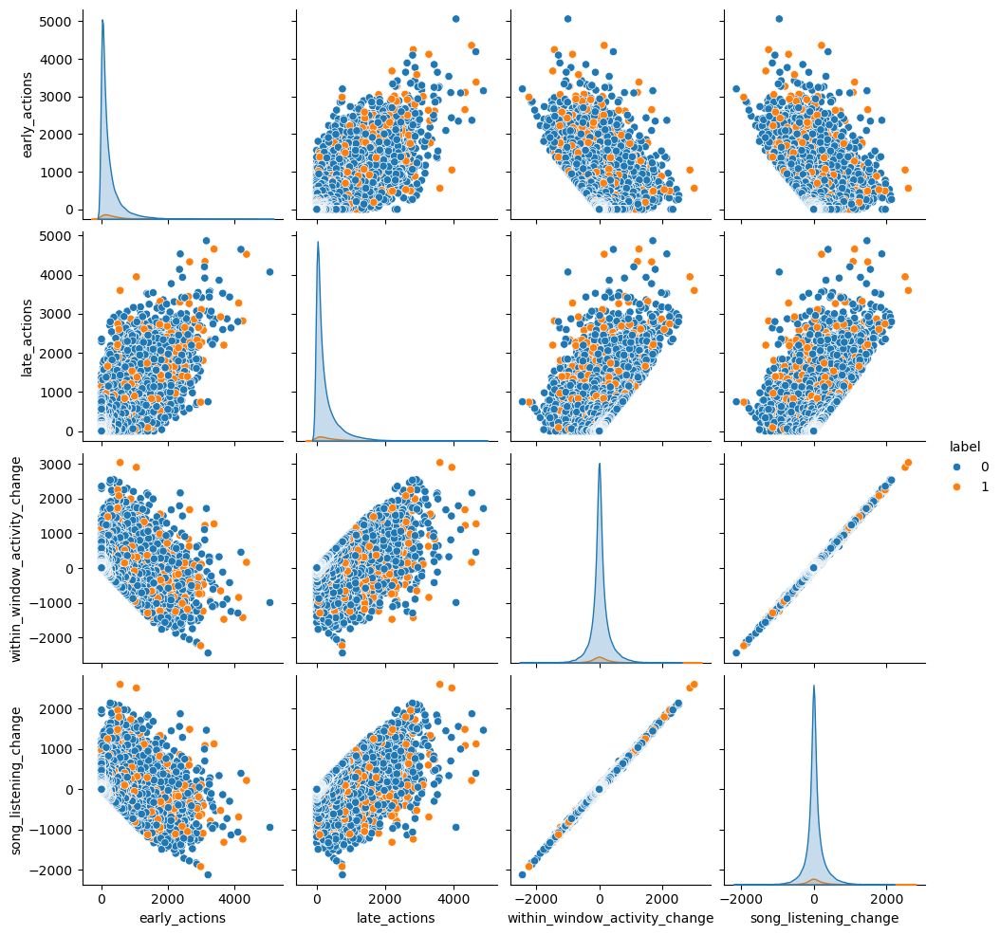

In [40]:
pair_features = [
    "early_actions", "late_actions", 
    "within_window_activity_change",
    "song_listening_change"
]

sns.pairplot(df_final[pair_features + ["label"]], hue="label")
plt.show()


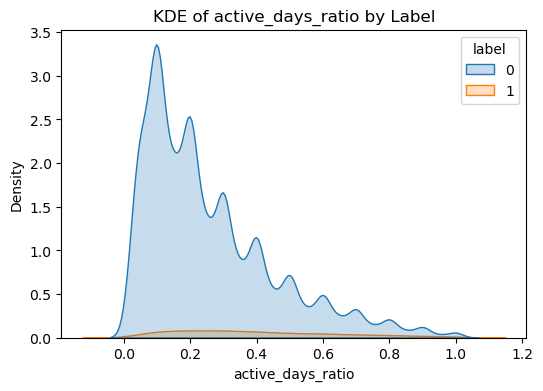

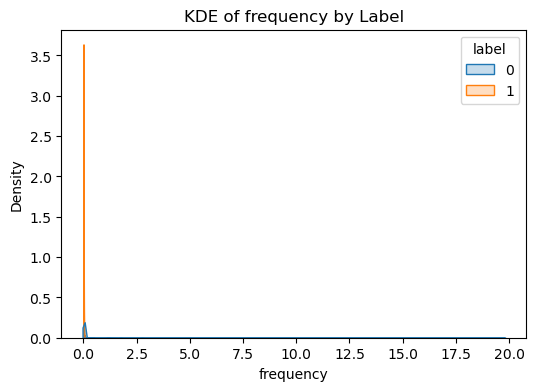

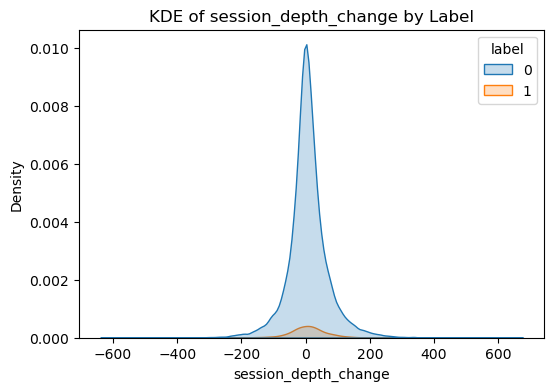

In [43]:
kde_cols = [
    "active_days_ratio", "frequency", "session_depth_change"
]

for col in kde_cols:
    plt.figure(figsize=(6,4))
    sns.kdeplot(data=df_final, x=col, hue="label", fill=True)
    plt.title(f"KDE of {col} by Label")
    plt.show()


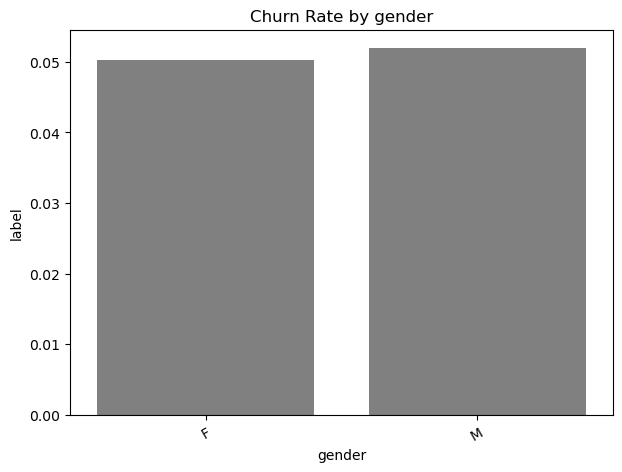

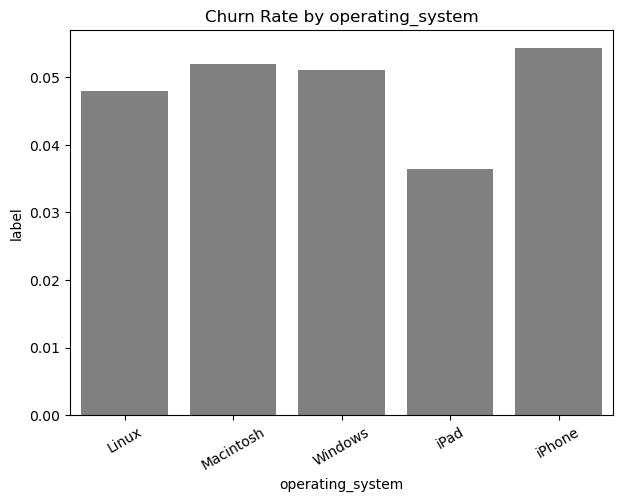

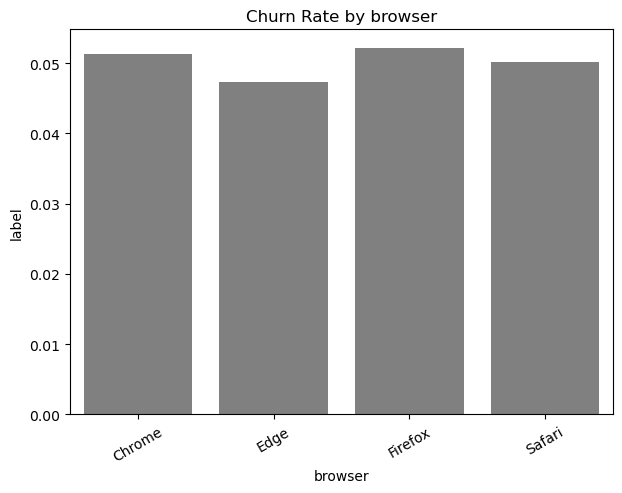

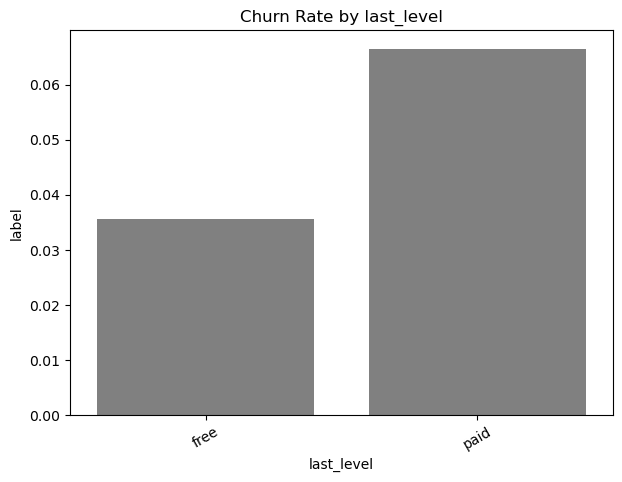

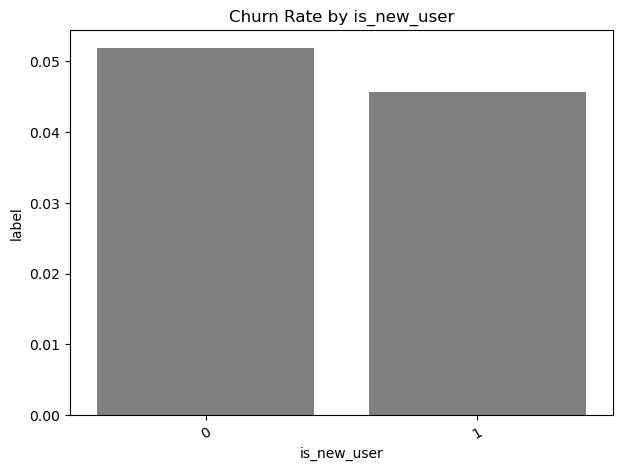

In [72]:
cat_cols = ["gender", "operating_system", "browser", "last_level", "is_new_user"]

for col in cat_cols:
    plt.figure(figsize=(7,5))
    sns.barplot(data=df_final, x=col, y="label", errorbar=None, color="gray")
    plt.title(f"Churn Rate by {col}")
    plt.xticks(rotation=30)
    plt.show()


In [130]:
cat_cols = ["gender", "operating_system", "browser", "last_level", "is_new_user"]

for col in cat_cols:
    fig = px.bar(
        df_final.groupby(col, observed=True)["label"].mean().reset_index(),
        x=col,
        y="label",
        text="label",
        title=f"Churn Rate by {col}",
    )

    fig.update_layout(
        title_x=0.5,
        width=500,
        height=500,
        xaxis_title=col,
        yaxis_title="Churn Rate",
    )

    fig.update_traces(texttemplate='%{text:.2%}')
    
    fig.show()

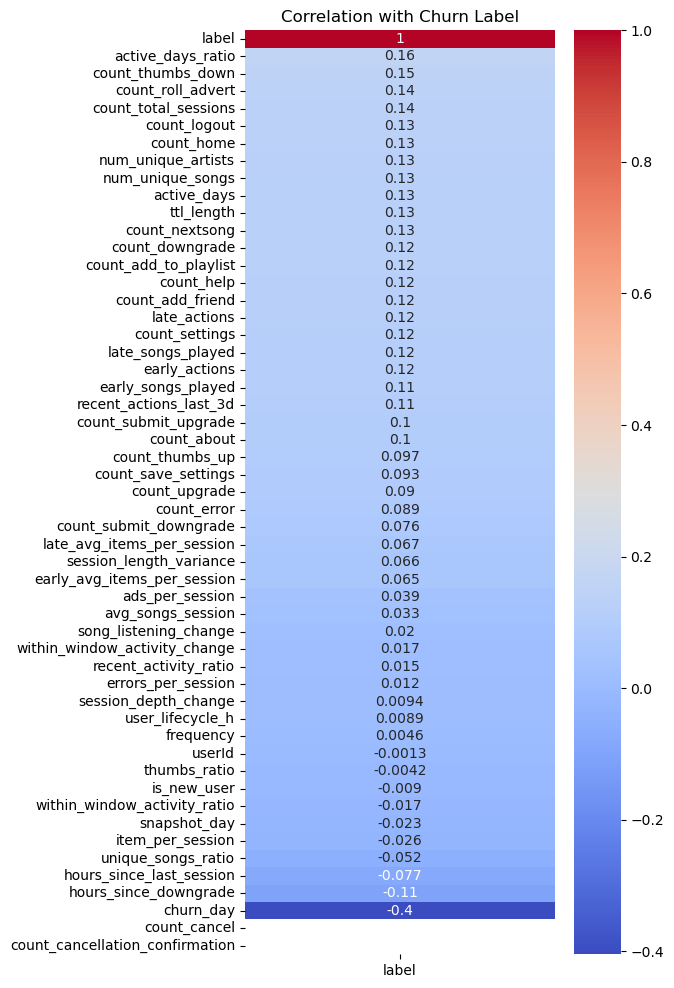

In [65]:
corr_with_label = df_final.corr(numeric_only=True)["label"].sort_values(ascending=False)

plt.figure(figsize=(5,12))
sns.heatmap(corr_with_label.to_frame(), annot=True, cmap="coolwarm")
plt.title("Correlation with Churn Label")
plt.show()



In [154]:
# Compute correlations
corr_with_label = df_final.corr(numeric_only=True)["label"].sort_values(ascending=False)

plot_df = corr_with_label.drop(labels=['label']).to_frame(name='Correlation')
plot_df.index.name = 'Feature'
plot_df = plot_df.reset_index()

# --- Correct sorting for y-axis ---
sorted_features = plot_df.sort_values("Correlation", ascending=True)["Feature"]

fig = px.bar(
    plot_df,
    x='Correlation',
    y='Feature',
    orientation='h',
    color='Correlation',
    color_continuous_scale='RdBu',
    range_color=[-1, 1],
    title="Correlation with Churn Label (Bar Chart)",
)

fig.update_layout(
    yaxis={
        'categoryorder': 'array',
        'categoryarray': sorted_features
    },
    template="simple_white",
    width=800,
    height=1000
)

fig.update_traces(textposition='outside', texttemplate='%{x:.2f}')

fig.show()


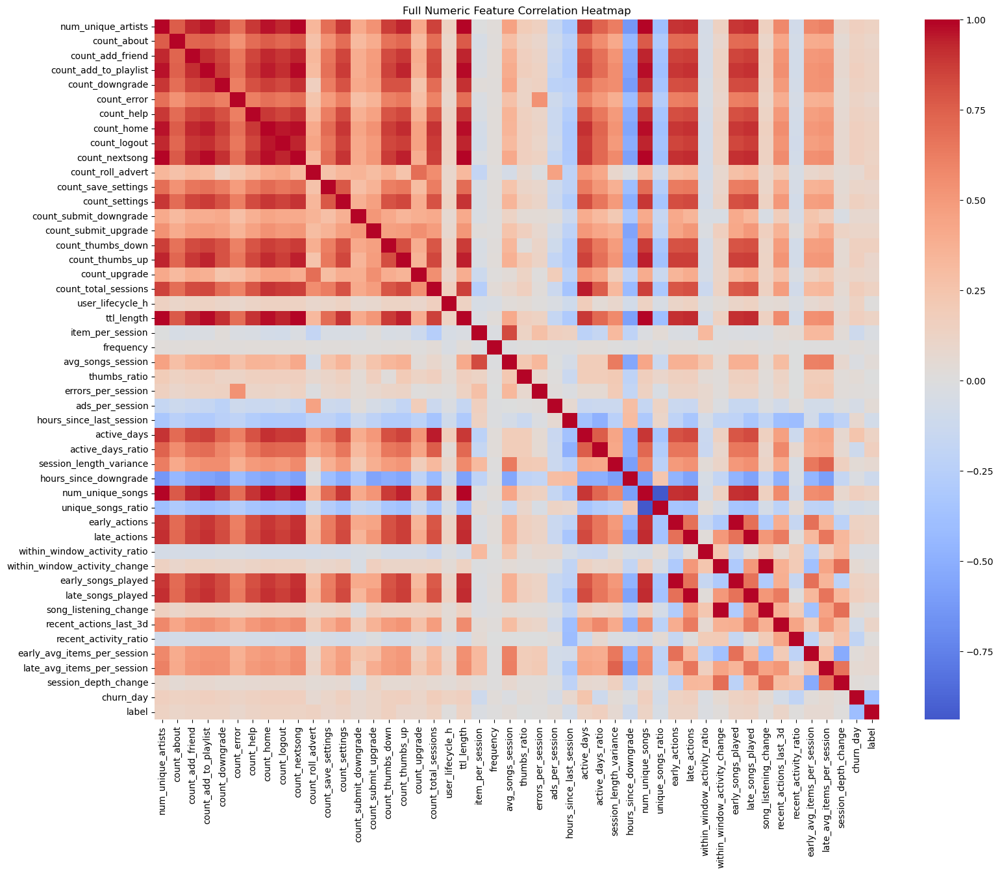

In [167]:
plt.figure(figsize=(18,14))
corr = df_final[num_cols + ["label"]].corr()
sns.heatmap(corr, cmap="coolwarm", center=0)
plt.title("Full Numeric Feature Correlation Heatmap")
plt.show()


In [74]:
corr_label = corr["label"].abs().sort_values(ascending=False)
print(corr_label.head(20))


label                    1.000000
churn_day                0.404499
active_days_ratio        0.161950
count_thumbs_down        0.149160
count_roll_advert        0.143885
count_total_sessions     0.135077
count_logout             0.134834
count_home               0.134054
num_unique_artists       0.129401
num_unique_songs         0.127171
active_days              0.126318
ttl_length               0.125526
count_nextsong           0.125489
count_downgrade          0.124782
count_add_to_playlist    0.122289
count_help               0.119815
count_add_friend         0.119609
late_actions             0.118026
count_settings           0.116691
late_songs_played        0.116536
Name: label, dtype: float64


<Figure size 700x400 with 0 Axes>

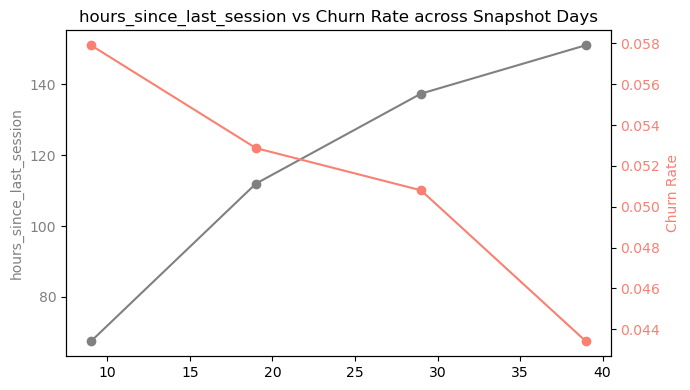

<Figure size 700x400 with 0 Axes>

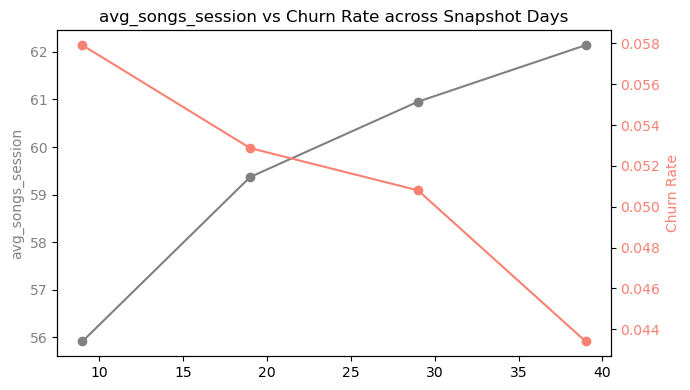

<Figure size 700x400 with 0 Axes>

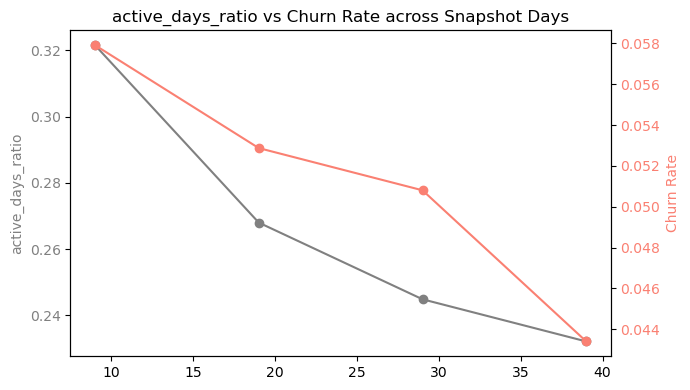

<Figure size 700x400 with 0 Axes>

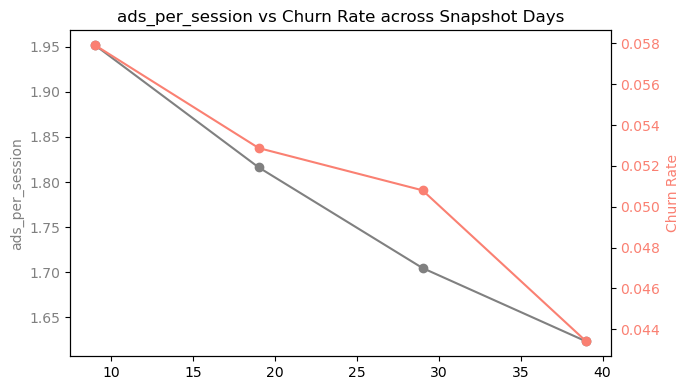

<Figure size 700x400 with 0 Axes>

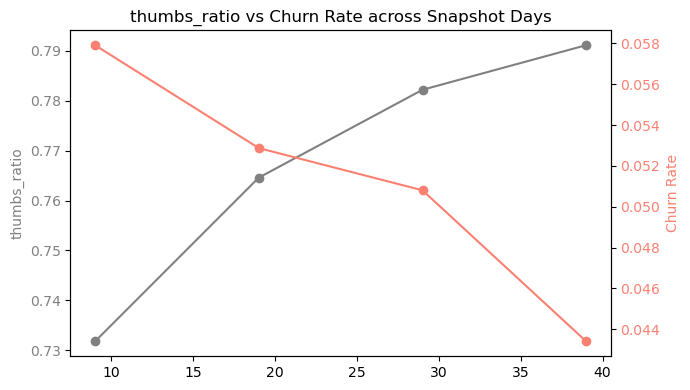

<Figure size 700x400 with 0 Axes>

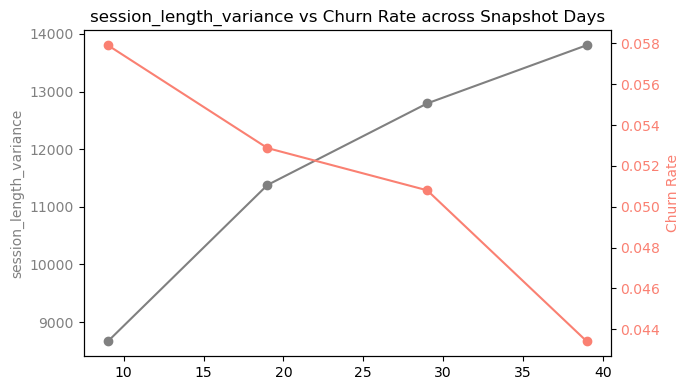

In [66]:
def plot_dual_axis(feature_list, df):
    
    for feat in feature_list:
        plt.figure(figsize=(7,4))

        # Compute values per snapshot_day
        mean_feat = df.groupby("snapshot_day")[feat].mean()
        churn_rate = df.groupby("snapshot_day")["label"].mean()

        fig, ax1 = plt.subplots(figsize=(7,4))

        # Engagement / Behavior feature
        ax1.plot(mean_feat.index, mean_feat.values, color="gray", marker="o", label=feat)
        ax1.set_ylabel(feat, color="gray")
        ax1.tick_params(axis='y', labelcolor="gray")

        # Churn rate
        ax2 = ax1.twinx()
        ax2.plot(churn_rate.index, churn_rate.values, color="salmon", marker="o", label="Churn Rate")
        ax2.set_ylabel("Churn Rate", color="salmon")
        ax2.tick_params(axis='y', labelcolor="salmon")

        plt.title(f"{feat} vs Churn Rate across Snapshot Days")
        plt.tight_layout()
        plt.show()


# Features you want to visualize
trend_features = [
    "hours_since_last_session",
    "avg_songs_session",
    "active_days_ratio",
    "ads_per_session",
    "thumbs_ratio",
    "session_length_variance"
]

plot_dual_axis(trend_features, df_final)


In [147]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

def plot_dual_axis(feature_list, df):
    for feat in feature_list:
        mean_feat = df.groupby("snapshot_day")[feat].mean()
        churn_rate = df.groupby("snapshot_day")["label"].mean()

        fig = make_subplots(specs=[[{"secondary_y": True}]])

        # Engagement / Behavior feature (Primary Y-axis)
        fig.add_trace(
            go.Scatter(
                x=mean_feat.index, 
                y=mean_feat.values, 
                name=feat, 
                mode='lines+markers'
            ),
            secondary_y=False,
        )

        # Churn rate (Secondary Y-axis)
        fig.add_trace(
            go.Scatter(
                x=churn_rate.index, 
                y=churn_rate.values, 
                name="Churn Rate", 
                mode='lines+markers'
            ),
            secondary_y=True,
        )

        # Set title and axes labels
        fig.update_layout(
            title_text=f"{feat} vs Churn Rate across Snapshot Days",
            title_x=0.5,
            width=500,
            height=500,
            showlegend=False
        )

        # Set y-axis titles
        fig.update_yaxes(title_text=feat, secondary_y=False)
        fig.update_yaxes(title_text="Churn Rate", secondary_y=True) 
        
        fig.update_xaxes(title_text="Snapshot Day")

        fig.show()

trend_features = [
    "hours_since_last_session",
    "avg_songs_session",
    "active_days_ratio",
    "ads_per_session",
    "thumbs_ratio",
    "session_length_variance"
]


plot_dual_axis(trend_features, df_final)